In [137]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [155]:
def svd_embed(image_A, alpha, image_W): #输入要加数字水印的矩阵image_A,水印强度参数alpha，要嵌入的水印图像矩阵image_W
    U,S_temp,V = np.linalg.svd(image_A)  #对image_A做svd奇异值分解
    S_temp = list(S_temp)              #由于求出来S是一个只包含A奇异值的行向量
    S = np.zeros((image_A.shape))   #因此用一个mxn的零矩阵与S在相应的位置相加
    for i in range(0,len(S_temp)):
        S[i][i] = S_temp[i]

    L = S + np.multiply(alpha,image_W)     #算得到L
    U1,S1_temp,V1 = np.linalg.svd(L)    #对L做svd

    S1_temp = list(S1_temp)
    S1 = np.zeros(L.shape)
    for i in range(0,len(S1_temp)):
        S1[i][i] = S1_temp[i]

    Aw = np.dot(U,S1)    #Aw为加入水印后构造的图像
    Aw = np.dot(Aw,V)
    
    return Aw, U1, V1, S  #依次返回加入水印后构造的图像，L进行svd得到的U1和V1，A进行svd得到的S


In [101]:
#***********************测试svd_embed*********************
A = np.random.randn(5,4)
W = np.random.randn(5,4)
Aw,U1,V1,S = svd_embed(A,0.5,W)
print(Aw)

[[-1.74204574  0.18373985 -1.07561655  0.979592  ]
 [ 1.42490537 -0.13516569  0.10363487  0.58254112]
 [ 1.28456588 -1.12147246 -0.37035276 -0.89363155]
 [ 1.55884944 -0.39147258  0.93310999 -3.28390939]
 [-0.21724294  0.02662892 -0.63861583 -0.1896123 ]]


In [156]:
def svd_extract(image_A_S, L_U1, L_V1, alpha, image_P):#输入依次为，原始图片svd分解的S矩阵，embed过程L进行svd分解得到的U1和V1矩阵，待检测矩阵image_P
    Up,Sp_temp,Vp = np.linalg.svd(image_P)
    Sp_temp = list(Sp_temp)              #由于求出来S是一个只包含A奇异值的行向量
    Sp = np.zeros((image_P.shape))   #因此用一个mxn的零矩阵与S在相应的位置相加
    for i in range(0,len(Sp_temp)):
        Sp[i][i] = Sp_temp[i]
        
    F = np.dot(L_U1, Sp)
    F = np.dot(F, L_V1) #算得F

    WE = np.multiply(1/alpha, F-image_A_S) #提取出水印图片

    return WE  #返回水印

In [103]:
#***********************测试svd_extract*********************
A = np.random.randn(5,4)
W = np.random.randn(5,4)
WE = svd_extract(S,U1,V1,0.5,A)
print(WE)
print(W)

[[-2.49064447e+00 -8.21646093e-04 -3.37403796e-01  2.63869658e-01]
 [-5.07909440e-01 -1.63329888e+00  9.58608464e-01 -1.08843539e-01]
 [-6.64978463e-01 -7.53089969e-03 -1.38415153e+00 -1.63266903e-01]
 [-6.08344749e-01 -4.30783334e-01 -2.70835146e-01 -5.68858331e-02]
 [-2.21128988e-01 -1.51492096e-01 -6.12982953e-02  3.98795596e-01]]
[[ 1.436476   -0.05117173 -0.48844127  0.46655795]
 [-0.9266359   0.10038578  1.5811572  -0.15337526]
 [-1.10549718 -0.64732918  0.3838846  -0.45255661]
 [-1.11329916 -0.81677752 -0.55863714  0.11622937]
 [-0.40955906 -0.27022887 -0.14778041  0.81274861]]


In [234]:
def svd_heibai(alphas): #对黑白图片的svd
    print('------------------------------原始要加入水印的图片------------------------------')
    img_A=Image.open('dog.jpg')  #打开要加入水印的图片
    plt.figure("dog")
    plt.imshow(img_A)
    plt.show()
    image_A = np.asarray(img_A)  #将图片img_A转化为矩阵
    
    print('------------------------------将原始图片变为黑白------------------------------')
    array2 = np.array([0.299, 0.587, 0.144])  #将图片变为黑白图片的固定矩阵
    image_A = np.dot(image_A, array2)   #将图片变为黑白，保证为mxn维的矩阵
    plt.imshow(image_A, cmap="gray")      
    plt.show()
    print('要加入水印的图片转化维矩阵后的shape：', image_A.shape )        
    
    print('------------------------------原始水印图片------------------------------')
    img_W=Image.open('shuiyin.jpg')
    plt.figure("shuiyin")
    plt.imshow(img_W)
    plt.show()
    image_W = np.asarray(img_W)

    print('------------------------------将水印图片变为黑白------------------------------')
    array2 = np.array([0.299, 0.587, 0.144])  #将图片变为黑白图片的固定矩阵
    image_W = np.dot(image_W, array2)   #将图片变为黑白，保证为mxn维的矩阵
    plt.imshow(image_W, cmap="gray")      
    plt.show()
    print('水印图片转化维矩阵后的shape：', image_W.shape )  

    for alpha in alphas:
        Aw,U1,V1,S = svd_embed(image_A, alpha, image_W) #在image_A中加入水印
        WE = svd_extract(S, U1, V1, alpha, Aw)  #提取水印图片
        WE_compare = svd_extract(S, U1, V1, alpha, image_A)  #提取水印图片
  
    print('------------------------------加入水印后生成的图片------------------------------')
    image_Aw = Image.fromarray(Aw)  #将矩阵再转化为图片形式
    plt.imshow(image_Aw)
    plt.show()
    print('------------------------------提取出的水印图片------------------------------')
    image_WE = Image.fromarray(WE)
    plt.figure("shuiyin_extract")
    plt.imshow(image_WE)
    plt.show()

    print('------------------------------未加水印的图片提取出的水印图片------------------------------')
    image_WE_compare = Image.fromarray(WE_compare)  #将矩阵再转化为图片形式
    plt.imshow(image_WE_compare)
    plt.show()

In [253]:
def svd_heibai(alphas): #对黑白图片的svd
    print('------------------------------原始要加入水印的图片------------------------------')
    img_A=Image.open('dog.jpg')  #打开要加入水印的图片
    plt.figure("dog")
    plt.imshow(img_A)
    plt.show()
    image_A = np.asarray(img_A)  #将图片img_A转化为矩阵
    
    print('------------------------------将原始图片变为黑白------------------------------')
    array2 = np.array([0.299, 0.587, 0.144])  #将图片变为黑白图片的固定矩阵
    image_A = np.dot(image_A, array2)   #将图片变为黑白，保证为mxn维的矩阵
    plt.imshow(image_A, cmap="gray")      
    plt.show()
    print('要加入水印的图片转化维矩阵后的shape：', image_A.shape )        
    
    print('------------------------------原始水印图片------------------------------')
    img_W=Image.open('shuiyin.jpg')
    plt.figure("shuiyin")
    plt.imshow(img_W)
    plt.show()
    image_W = np.asarray(img_W)

    print('------------------------------将水印图片变为黑白------------------------------')
    array2 = np.array([0.299, 0.587, 0.144])  #将图片变为黑白图片的固定矩阵
    image_W = np.dot(image_W, array2)   #将图片变为黑白，保证为mxn维的矩阵
    plt.imshow(image_W, cmap="gray")      
    plt.show()
    print('水印图片转化维矩阵后的shape：', image_W.shape )  
    
    image_Aws = [] #存放不同alpha下的image_Aw
    image_WEs = []
    image_WEs_compare = []

    for alpha in alphas:
        Aw,U1,V1,S = svd_embed(image_A, alpha, image_W) #在image_A中加入水印
        WE = svd_extract(S, U1, V1, alpha, Aw)  #提取水印图片
        WE_compare = svd_extract(S, U1, V1, alpha, image_A)  #提取水印图片
        image_Aw = Image.fromarray(Aw)#将矩阵再转化为图片形式
        image_WE = Image.fromarray(WE)
        image_WE_compare = Image.fromarray(WE_compare)  #将矩阵再转化为图片形式
        image_Aws.append(image_Aw)
        image_WEs.append(image_WE)
        image_WEs_compare.append(image_WE_compare)
  
    N=3
    M=3
    figure = [image_Aws,image_WEs,image_WEs_compare]
    #形成NxM大小的画布
    count=1
    plt.figure(dpi=300,figsize=(35,35))
    for i in range(N):#有8张图片
        for name in figure:
            plt.subplot(N,M,count)#表示第i张图片，下标只能从1开始，不能从0
            count+=1
            plt.imshow(name[i])
            #下面两行是消除每张图片自己单独的横纵坐标，不然每张图片会有单独的横纵坐标，影响美观
            plt.xticks([])
            plt.yticks([])
    plt.show()

------------------------------原始要加入水印的图片------------------------------


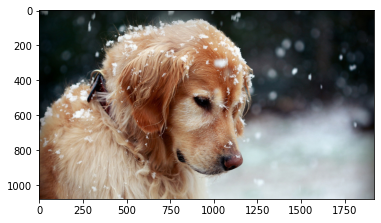

------------------------------将原始图片变为黑白------------------------------


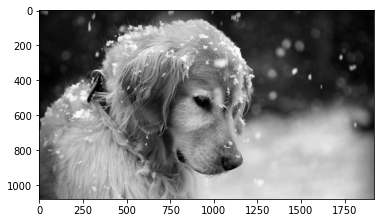

要加入水印的图片转化维矩阵后的shape： (1080, 1920)
------------------------------原始水印图片------------------------------


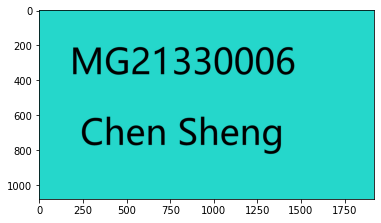

------------------------------将水印图片变为黑白------------------------------


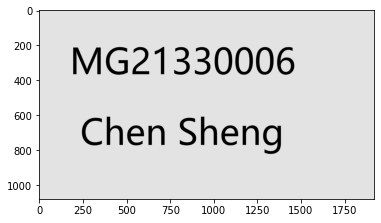

水印图片转化维矩阵后的shape： (1080, 1920)


In [254]:
alphas = [1.0,0.5,0.2]
svd_heibai(alphas)

In [232]:
def svd_rgb(alpha):#对rgb三通道图片的svd
    print('------------------------------原始要加入水印的图片------------------------------')
    img_A=Image.open('dog.jpg')  #打开要加入水印的图片
    plt.figure("dog")
    plt.imshow(img_A)
    plt.show()
    image_A = np.asarray(img_A).T  #将图片img_A转化为矩阵
      
    
    print('------------------------------原始水印图片------------------------------')
    img_W=Image.open('shuiyin.jpg')
    plt.figure("shuiyin")
    plt.imshow(img_W)
    plt.show()
    image_W = np.asarray(img_W).T

    Aws = []             #用来存放加入水印后图片rgb三个通道下的图片对应的矩阵
    WEs= []              #用来存放生成的水印图片rgb三个通道下的图片对应的矩阵
    WEs_compare = []     #用来和WE做对比
    for channel in range(0,3):
        Aw,U1,V1,S = svd_embed(image_A[channel], alpha, image_W[channel]) #在image_A[channel]中加入水印
        WE = svd_extract(S, U1, V1, alpha, Aw)  #提取水印图片
        WE_compare = svd_extract(S, U1, V1, alpha, image_A[channel]) #用不加水印的图片进行svd提取和WE做对比
        Aws.append(Aw)
        WEs.append(WE)
        WEs_compare.append(WE_compare)  #用来和WE做对比
    
    Aww = np.zeros((image_A.shape)) #将其设置为3x1920x1080的零矩阵
    WEe = np.zeros((image_W.shape))
    WE_compare = np.zeros((image_W.shape))

    for channel in range(0,3):    #将三个通道放入到零矩阵中还原图片
        Aww[channel] = Aws[channel]
        WEe[channel] = WEs[channel]
        WE_compare[channel] = WEs_compare[channel]
   
    print('------------------------------加入水印后生成的图片------------------------------')
    image_Aw = Image.fromarray(np.uint8(Aww.T))   #必须添加np.uint8(),否则会报错
    plt.imshow(image_Aw)
    plt.show()
    
    print('------------------------------提取出的水印图片------------------------------')
    image_WE = Image.fromarray(np.uint8(WEe.T))
    plt.figure("shuiyin_extract")
    plt.imshow(image_WE)
    plt.show()

    print('------------------------------未加水印的图片提取出的水印图片------------------------------')
    image_WE_compare = Image.fromarray(np.uint8(WE_compare.T))   #必须添加np.uint8(),否则会报错
    plt.imshow(image_WE_compare)
    plt.show()
    

------------------------------原始要加入水印的图片------------------------------


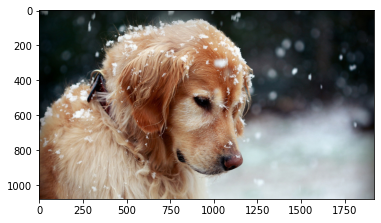

------------------------------原始水印图片------------------------------


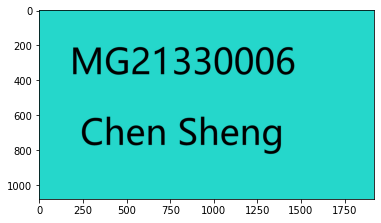

------------------------------加入水印后生成的图片------------------------------


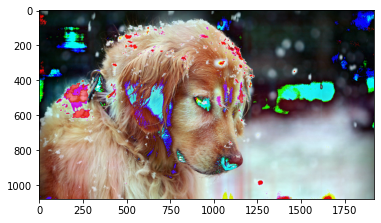

------------------------------提取出的水印图片------------------------------


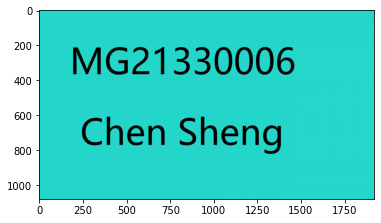

------------------------------未加水印的图片提取出的水印图片------------------------------


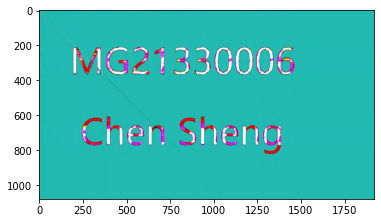

In [233]:
svd_rgb(0.2)